# Homework #1

Remember: You must ingest the data to your notebooks directly from the data server. Also, don't write the same code with modifications to do similar things over and over again. Write a function.

## Question 1

Use [World Bank's Data Service](https://data.worldbank.org/) to retrieve

* Literacy rates of women (percentage of females ages 15 and above)
* Child mortality rate, under 5 year old. (per 1,000 live births)
* Gini index (Economic Inequality)

1. Plot each dataset for Turkey from earliest date available until this year.
2. Plot the same data for Greece, Bulgaria, Romania, Poland, Syria and Iran for the same periods. 
3. Do a scatter plot of female literacy rate against child mortality rate for Turkey. Do you see a relation? Which direction do you think the relation works?
4. Do a scatter plot of female literacy rate against gini index for Turkey. Do you see a relation? Which direction do you think the relation works?
5. Do a scatter plot of child mortality rate against the gini index for Turkey. Do you see a relation? Which direction do you think the relation works?

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import gzip
from urllib.request import urlopen
from xmltodict import parse
from zipfile import ZipFile
from io import BytesIO
import requests
from io import StringIO
import folium
from folium import plugins

In [2]:
def zip_tocsv(url):
    with urlopen(url) as url:
        zfile = ZipFile(BytesIO(url.read()))
    file_name=zfile.namelist()[1]
    deneme=zfile.open(file_name).read()[104:]
    s=str(deneme,'utf-8')
    data = StringIO(s) 
    df=pd.read_csv(data)
    return df

In [3]:
women=zip_tocsv('https://api.worldbank.org/v2/en/indicator/SE.ADT.LITR.FE.ZS?downloadformat=csv')
child=zip_tocsv('https://api.worldbank.org/v2/en/indicator/SH.DYN.MORT?downloadformat=csv')
gini=zip_tocsv('https://api.worldbank.org/v2/en/indicator/SI.POV.GINI?downloadformat=csv')

In [4]:
def plot_(country_code,data):
    legend=data['Indicator Name'][0]
    title=data[data['Country Code']==country_code].index[0]
    data=data[data['Country Code']==country_code].dropna(axis=1).drop('Indicator Name',axis=1).drop('Indicator Code',axis=1).drop('Country Code',axis=1).transpose()
    data.plot()
    plt.legend([legend])
    plt.title(title)

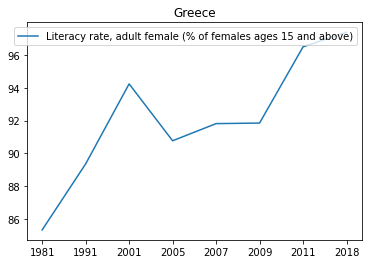

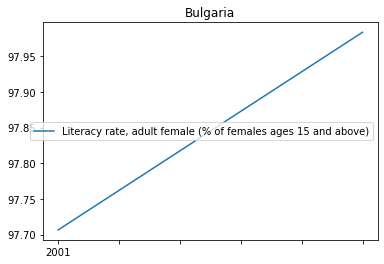

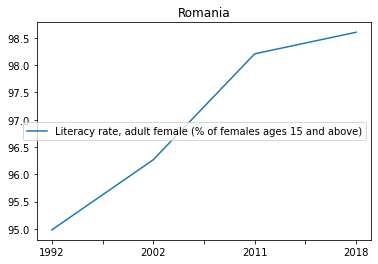

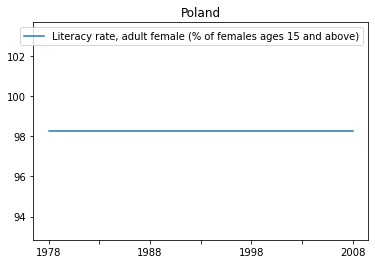

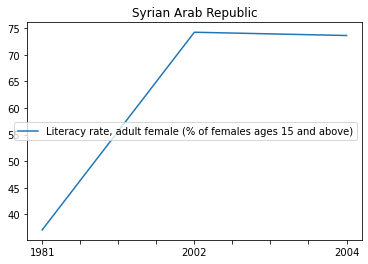

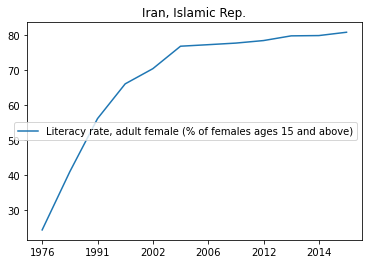

In [5]:
plot_('GRC',women)
plot_('BGR',women)
plot_('ROU',women)
plot_('POL',women)
plot_('SYR',women)
plot_('IRN',women)

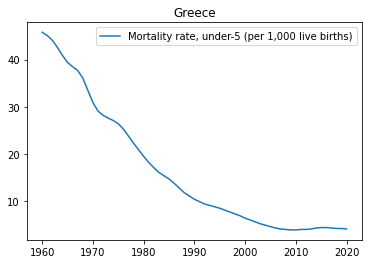

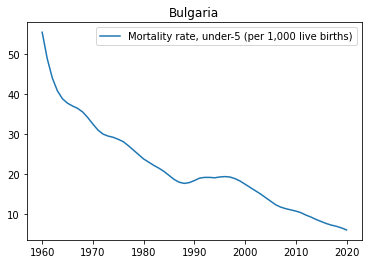

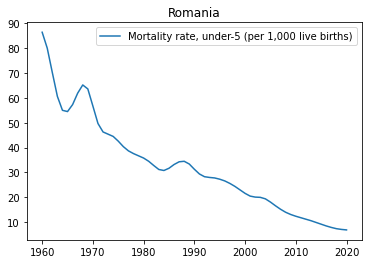

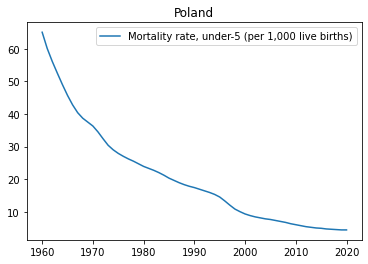

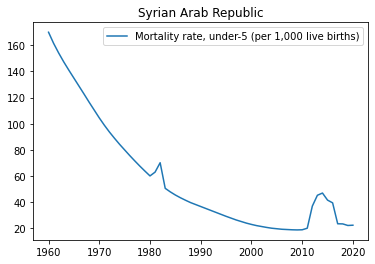

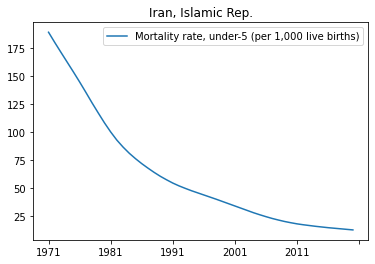

In [6]:
plot_('GRC',child)
plot_('BGR',child)
plot_('ROU',child)
plot_('POL',child)
plot_('SYR',child)
plot_('IRN',child)

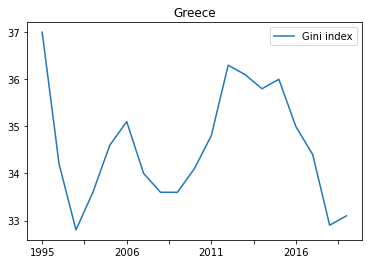

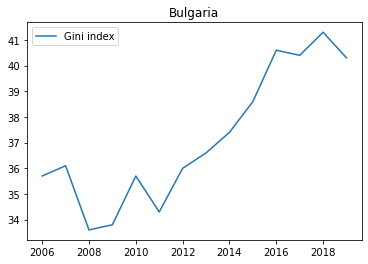

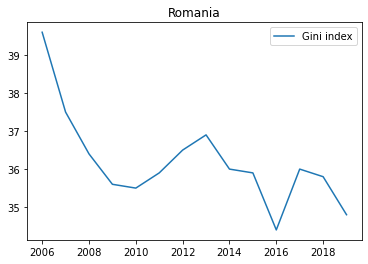

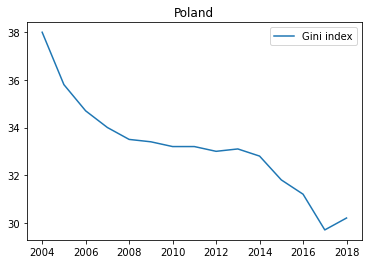

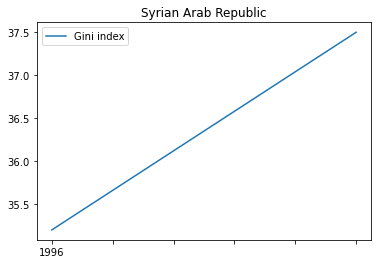

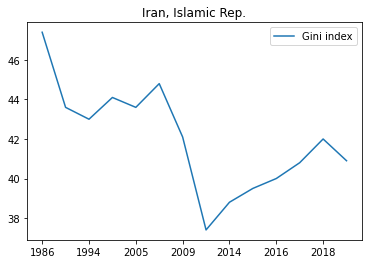

In [7]:
plot_('GRC',gini)
plot_('BGR',gini)
plot_('ROU',gini)
plot_('POL',gini)
plot_('SYR',gini)
plot_('IRN',gini)

In [8]:
women_TR=women[women['Country Code']=='TUR'].dropna(axis=1).drop('Indicator Name',axis=1).drop('Indicator Code',axis=1).drop('Country Code',axis=1).transpose()
child_TR=child[child['Country Code']=='TUR'].dropna(axis=1).drop('Indicator Name',axis=1).drop('Indicator Code',axis=1).drop('Country Code',axis=1).transpose()
gini_TR=gini[gini['Country Code']=='TUR'].dropna(axis=1).drop('Indicator Name',axis=1).drop('Indicator Code',axis=1).drop('Country Code',axis=1).transpose()

In [9]:
women_TR.index = pd.to_datetime(women_TR.index)
women_TR.index=women_TR.index.year
child_TR.index = pd.to_datetime(child_TR.index)
child_TR.index=child_TR.index.year
gini_TR.index = pd.to_datetime(gini_TR.index)
gini_TR.index=gini_TR.index.year

increase in female literacy rate shows a decrease in child mortality.

Text(0.5, 1.0, 'Turkiye')

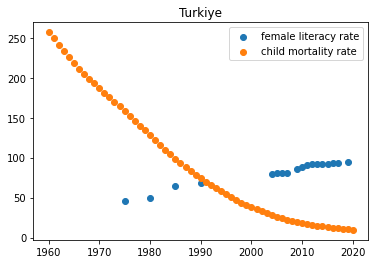

In [10]:
plt.scatter(women_TR.index,women_TR['Turkiye'])
plt.scatter(child_TR.index,child_TR['Turkiye'])
plt.legend(['female literacy rate','child mortality rate'])
plt.title('Turkiye')

There is no clear relation.

Text(0.5, 1.0, 'Turkiye')

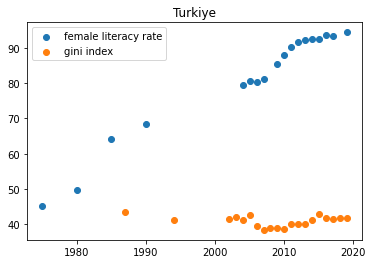

In [11]:
plt.scatter(women_TR.index,women_TR['Turkiye'])
plt.scatter(gini_TR.index,gini_TR['Turkiye'])
plt.legend(['female literacy rate','gini index'])
plt.title('Turkiye')

There is no clear relation.

Text(0.5, 1.0, 'Turkiye')

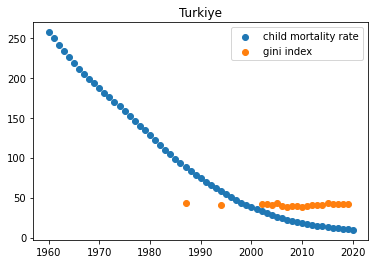

In [12]:
plt.scatter(child_TR.index,child_TR['Turkiye'])
plt.scatter(gini_TR.index,gini_TR['Turkiye'])
plt.legend(['child mortality rate','gini index'])
plt.title('Turkiye')

## Question 2

Use Istanbul Municipality Data Server to retrieve the data on [Rail Transportation Data](https://data.ibb.gov.tr/dataset/yas-grubuna-gore-rayli-sistemler-istasyon-bazli-yolcu-ve-yolculuk-sayilari).

1. Explore the dataset and explain each column.
2. Notice that the longitude and lattitude data is not recorded correctly. However, it is easy to correct the data. Explain how you would correct it and then write a function to correct it.
3. Notice that the passenger information is split according to age brackets. Find the total number of passengers for each station ~~in each month~~ and store it in a pandas dataframe. Then plot it on a map of Istanbul. Use disks of different sizes depending on the total number of passengers.
4. Write a function that accepts the age bracket as input (<20, 20-30, 30-60, 60+, unknown) and returns a probability an array of maps (dictionaries) of the form

    {Station Name: probability that the specific age bracket uses the station}
5. The return value for the function you wrote above is a probability distribution on the set of stations, i.e. the usage patterns of different age brackets. Figure out which stations are favored by each age bracket.
6. How do we check that the usage patterns for different age brackets are different? Use your idea to write a code to check for these differences.

In [13]:
ibb=pd.read_csv("https://data.ibb.gov.tr/datastore/dump/7aec630d-2757-4da0-97f1-71b140abd818?bom=True")

In [14]:
ibb=ibb.dropna(axis=0)

In [15]:
type(ibb['LONGITUDE'][0])

numpy.float64

In [16]:
yolcu=ibb.groupby('STATION_NAME').sum()['PASSENGER_COUNT']
yolcu=pd.DataFrame(yolcu)
yolcu

,PASSENGER_COUNT
STATION_NAME,
4 Levent 2 Güney,1464498
4 Levent Kuzey,1821355
AKSARAY,1873032
AKSARAY 1,804448
ALTINŞEHİR,522763
...,...
Şehitlik,1814787
Şişhane Güney,1185692
Şişhane Kuzey,1738115


In [17]:
m=folium.Map(location=[41,29])
location=ibb[["LATITUDE","LONGITUDE"]]
 
plugins.MarkerCluster(location).add_to(m)
m

In [20]:
sta_age=pd.DataFrame(ibb.groupby(['STATION_NAME','age_group']).sum()['PASSENGER_COUNT'])
sta_age

PASSENGER_COUNT
STATION_NAME     age_group                 
4 Levent 2 Güney 20-30               694120
                 30-60               514923
                 60+                 120635
                 <20                 134820
4 Levent Kuzey   20-30               769464
...                                     ...
Şişli 2 Kuzey    <20                 330422
Şişli Güney      20-30              1284681
                 30-60               978849
                 60+                 308193
                 <20                 282496

[932 rows x 1 columns]

In [21]:
ibb.groupby(['STATION_NAME','age_group']).sum()['PASSENGER_COUNT'].index

MultiIndex([('4 Levent 2 Güney', '20-30'),
            ('4 Levent 2 Güney', '30-60'),
            ('4 Levent 2 Güney',   '60+'),
            ('4 Levent 2 Güney',   '<20'),
            (  '4 Levent Kuzey', '20-30'),
            (  '4 Levent Kuzey', '30-60'),
            (  '4 Levent Kuzey',   '60+'),
            (  '4 Levent Kuzey',   '<20'),
            (         'AKSARAY', '20-30'),
            (         'AKSARAY', '30-60'),
            ...
            (   'Şişhane Kuzey',   '60+'),
            (   'Şişhane Kuzey',   '<20'),
            (   'Şişli 2 Kuzey', '20-30'),
            (   'Şişli 2 Kuzey', '30-60'),
            (   'Şişli 2 Kuzey',   '60+'),
            (   'Şişli 2 Kuzey',   '<20'),
            (     'Şişli Güney', '20-30'),
            (     'Şişli Güney', '30-60'),
            (     'Şişli Güney',   '60+'),
            (     'Şişli Güney',   '<20')],
           names=['STATION_NAME', 'age_group'], length=932)

In [22]:
def age_prob(age):
    dic={}
    for i in ibb.groupby(['STATION_NAME','age_group']).sum()['PASSENGER_COUNT'].index:
        if i[1]==age:
            prob=(ibb.groupby(['STATION_NAME']).sum()['PASSENGER_COUNT'][i[0]] / ibb['PASSENGER_COUNT'].sum()) * (ibb.groupby(['STATION_NAME','age_group']).sum()['PASSENGER_COUNT'][i[0]][i[1]] / ibb.groupby(['STATION_NAME']).sum()['PASSENGER_COUNT'][i[0]])
            dic[i[0]]=prob
    return dic

In [23]:
age_prob('20-30')

{'4 Levent 2 Güney': 0.002749245980315974,
 '4 Levent Kuzey': 0.003047665834434753,
 'AKSARAY': 0.0029689377148722266,
 'AKSARAY 1': 0.0013805364118265916,
 'ALTINŞEHİR': 0.0007661029868764142,
 'ATAKOY': 0.004894479307557255,
 'Acıbadem (Batı)': 0.0005490372393036075,
 'Acıbadem (Doğu)': 0.0006689731546063619,
 'Aksaray': 0.0023251946312832865,
 'Akıncılar': 0.0005269084470313413,
 'Akşemsettin': 0.0015236111143952452,
 'Ali Fuat Başgil': 0.0017408352925552884,
 'Altunizade 1': 0.0035712710037222118,
 'Altunizade 2': 0.0014429382593743904,
 'Ataköy': 0.0004100143990035286,
 'Atalar': 0.0005575608048969342,
 'Atatürk Oto Sanayi Güney': 0.000719310512936097,
 'Atatürk Oto Sanayi Kuzey': 0.0005070570944506007,
 'Atatürk Öğrenci Yurdu': 0.005048097565706502,
 'Aydıntepe': 0.0004060338304992101,
 'Ayrılıkçeşme': 0.006427600217951375,
 'Ayrılıkçeşmesi': 0.0072604777365833165,
 'Ayvansaray Eyüp Sultan': 3.960764680913925e-09,
 'BAGCILAR MEYDAN': 0.002686852054297537,
 'BAHCELIEVLER': 0.00200

In [24]:
fav={}
for i in ibb['age_group'].unique():
    fav[i]=max(age_prob(i), key=age_prob(i).get)

In [25]:
fav

{'60+': 'Eminönü 2',
 '30-60': 'YENIKAPI',
 '<20': 'YENIKAPI',
 '20-30': 'YENIKAPI'}

# Question 3

For this question use Yahoo Finance API via [yfinance](https://pypi.org/project/yfinance/) library. Retrieve the data for Microsoft [MSFT], Apple [AAPL] and NASDAQ-100 [NDX]. from January 1, 2000.

1. Calculate the log of each series, and then calculate the first derivative of the result. What you got is called the [log-return](https://core.ac.uk/download/pdf/161062652.pdf) of each series. 
2. Merge the series you obtain in Step 1 into a single pandas dataframe.
3. Plot the histograms of results you obtained above (use 10 bins).
4. Plot all three series in a single plot to compare. Do you see a relationship? 
5. How do we see if there are any correlations between these series? What is the statistically correct way of testing it? Find the right statistical test and measure all three correlations.

In [26]:
import yfinance as yf

In [27]:
msft = yf.Ticker("MSFT")
AAPL = yf.Ticker("AAPL")
NDX = yf.Ticker("NDX")

In [28]:
msft=msft.history(start='2000-01-01')
aapl=AAPL.history(start='2000-01-01')
ndx=NDX.history(start='2000-01-01')

In [29]:
msft=pd.DataFrame(msft['Close'])
aapl=pd.DataFrame(aapl['Close'])
ndx=pd.DataFrame(ndx['Close'])

In [30]:
msft['log_ret'] = np.log(msft) - np.log(msft.shift(1))
aapl['log_ret'] = np.log(aapl) - np.log(aapl.shift(1))
ndx['log_ret'] = np.log(ndx) - np.log(ndx.shift(1))

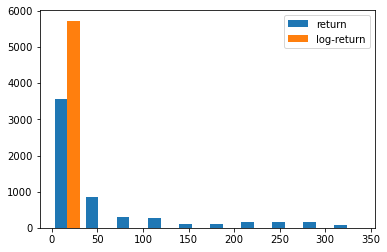

In [31]:
plt.hist(msft,bins=10)
plt.legend(['return','log-return'])

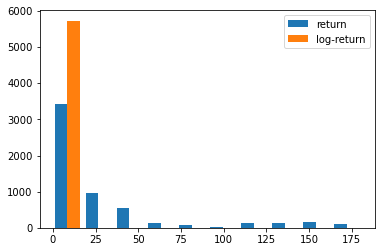

In [32]:
plt.hist(aapl,bins=10)
plt.legend(['return','log-return'])

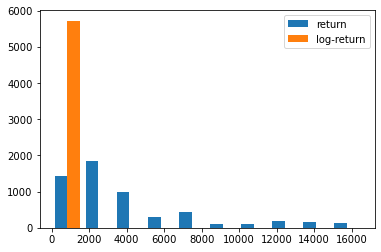

In [33]:
plt.hist(ndx,bins=10)
plt.legend(['return','log-return'])

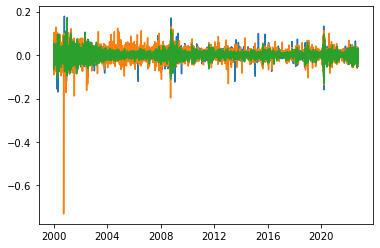

In [34]:
plt.plot(msft['log_ret'])
plt.plot(aapl['log_ret'])
plt.plot(ndx['log_ret'])

In [35]:
new_df=pd.DataFrame()
new_df['msft_log_ret']=msft['log_ret']
new_df['aapl_log_ret']=aapl['log_ret']
new_df['ndx_log_ret']=ndx['log_ret']
new_df=new_df[1:]

In [36]:
new_df.corr()

,msft_log_ret,aapl_log_ret,ndx_log_ret
msft_log_ret,1.000000,0.461537,0.747084
aapl_log_ret,0.461537,1.000000,0.647775
ndx_log_ret,0.747084,0.647775,1.000000
